# QFT Resampling

The following is a notebook that showcases QFT resampling as per the work done in ***Efficient quantum resampling of smooth distributions***.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

In [2]:
from qft_resampling_class import qft_resampling_1d

[Qibo 0.1.7rc2.dev0|INFO|2022-02-28 13:08:52]: Using qibojit (numba) backend on /CPU:0


In [3]:
def mpl_params():
    mpl.rcParams['axes.linewidth'] = 2.5
    mpl.rcParams['xtick.top'] = True
    mpl.rcParams['ytick.right'] = True
    mpl.rcParams['xtick.direction'] = 'in'
    mpl.rcParams['ytick.direction'] = 'in'
    mpl.rcParams['xtick.major.size'] = 5
    mpl.rcParams['ytick.major.size'] = 5
    mpl.rcParams['xtick.labelsize'] = 'large'
    mpl.rcParams['ytick.labelsize'] = 'large'
    mpl.rcParams['axes.grid'] = False
    mpl.rcParams['text.usetex'] = True
    mpl.rcParams['font.weight'] = 'bold'

**QFT resampling for distributions**

In [4]:
# Set the distribution to be resampled.
def gaussian(x, mu, sig):
    dx = x[1]-x[0]
    gauss = np.exp(-0.5*((x-mu)/sig)**2)/(sig*np.sqrt(2*np.pi))
    f = gauss*dx/(np.sum(gauss*dx))
    return f

In [5]:
# Set the initial and ancilla qubits.
n = 5
m = 10

In [6]:
# Set the limits for the distribution.
x_n = np.linspace(-5, 5, 2**n+1)[:-1]
x_nm = np.linspace(-5, 5, 2**(n+m)+1)[:-1]

In [7]:
# Create the distribution in the small space.
g = gaussian(x_n, 0, 1)

In [8]:
resample_1d = qft_resampling_1d(g, upscale_factor=m)

In [9]:
%%time
resampled_probability = resample_1d()

CPU times: user 53.9 ms, sys: 29.6 ms, total: 83.5 ms
Wall time: 51.9 ms


In [ ]:
# See the depth and gate composition of the qft resampling algorithm for
# the chosen parameters.
print(resample_1d.qft_int_circuit().summary())

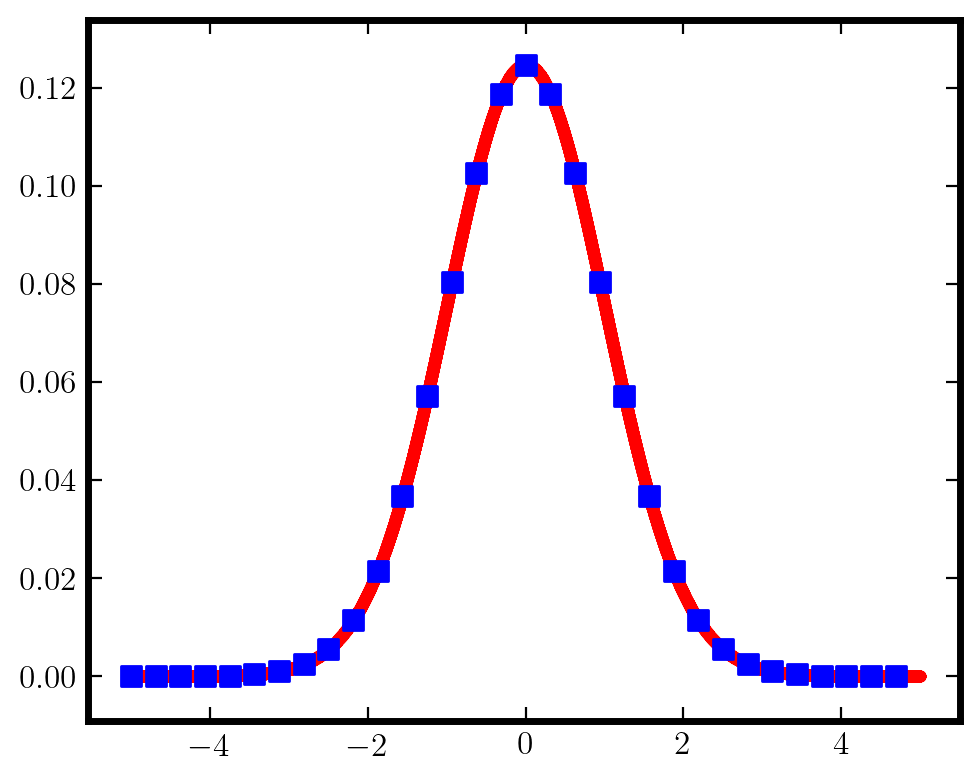

In [10]:
mpl_params()
fig, ax = plt.subplots(figsize=(5, 4), dpi=200)
ax.scatter(x_nm, 2**m*resampled_probability, color='r', s=10, label=f'{n+m} qubits')
ax.scatter(x_n, g, color='b', s=50, marker='s', label=f'{n} qubits')
fig.tight_layout()
plt.show()

**Using unary uploading**

In [11]:
# The number of qubits depend on the small space.
n = 4
m = 2**n-n

In [12]:
x_nm = np.linspace(-5, 5, 2**(n+m)+1)[:-1]
x_n = np.linspace(-5, 5, 2**n+1)[:-1]

In [13]:
g = gaussian(x_n, 0, 1)

In [14]:
resample_1d_unary = qft_resampling_1d(g, unary=True)

In [15]:
%%time
resampled_probability = resample_1d_unary()

CPU times: user 82.8 ms, sys: 46.7 ms, total: 129 ms
Wall time: 73.1 ms


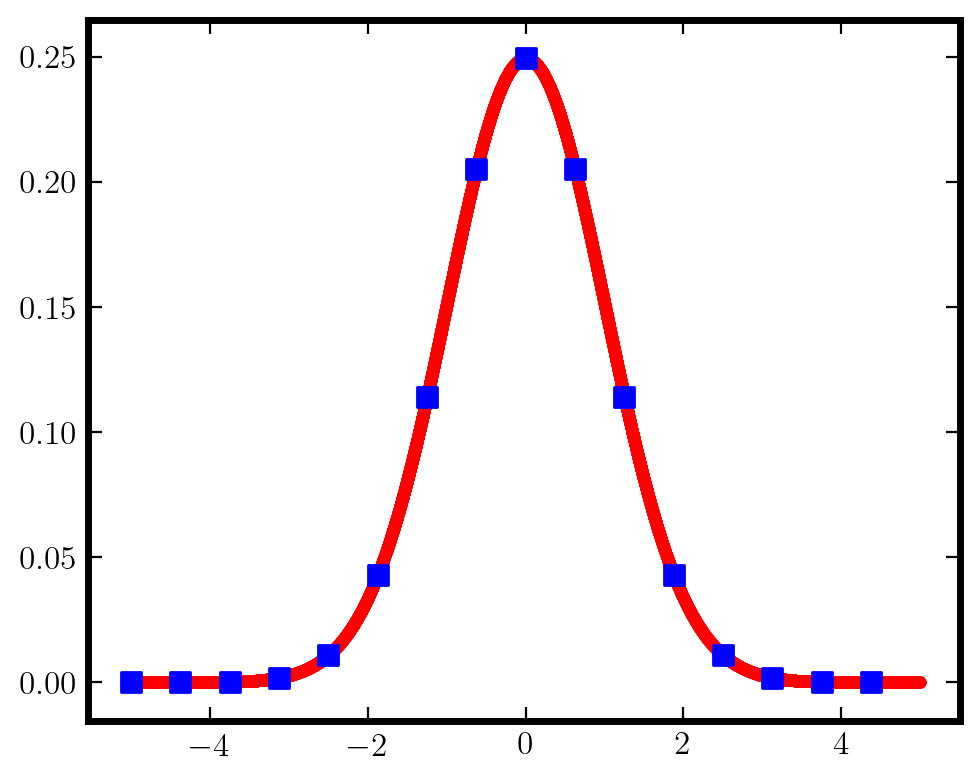

In [16]:
mpl_params()
fig, ax = plt.subplots(figsize=(5, 4), dpi=200)
ax.scatter(x_nm, 2**m*resampled_probability, color='r', s=10, label=f'{n+m} qubits')
ax.scatter(x_n, g, color='b', s=50, marker='s', label=f'{n} qubits')
fig.tight_layout()
plt.show()

**QFT resampling for images**

In [17]:
from qft_resampling_class import qft_resampling_2d
from skimage import data

**Grayscale image**

In [18]:
image = data.camera()

/Users/sergi-rc/Documents/PhD/quantum-env/lib/python3.7/site-packages/skimage/io/manage_plugins.py:23: UserWarning: Your installed pillow version is < 7.1.0. Several security issues (CVE-2020-11538, CVE-2020-10379, CVE-2020-10994, CVE-2020-10177) have been fixed in pillow 7.1.0 or higher. We recommend to upgrade this library.
  from .collection import imread_collection_wrapper


In [19]:
# Set the upscale factor for both directions
upscale_factor = 2

In [20]:
resample_image_gray = qft_resampling_2d(image, upscale_factor)

In [21]:
%%time
upscaled_image = resample_image_gray()

CPU times: user 8.37 s, sys: 181 ms, total: 8.55 s
Wall time: 4.6 s


In [31]:
print(resample_image_gray.qft_int_circuit().summary())

Circuit depth = 42
Total number of gates = 244
Number of qubits = 22
Most common gates:
cu1: 182
h: 40
swap: 18
cx: 4


In [22]:
image_plot = upscaled_image.copy()
image_plot[:image.shape[0], :image.shape[1]] = image

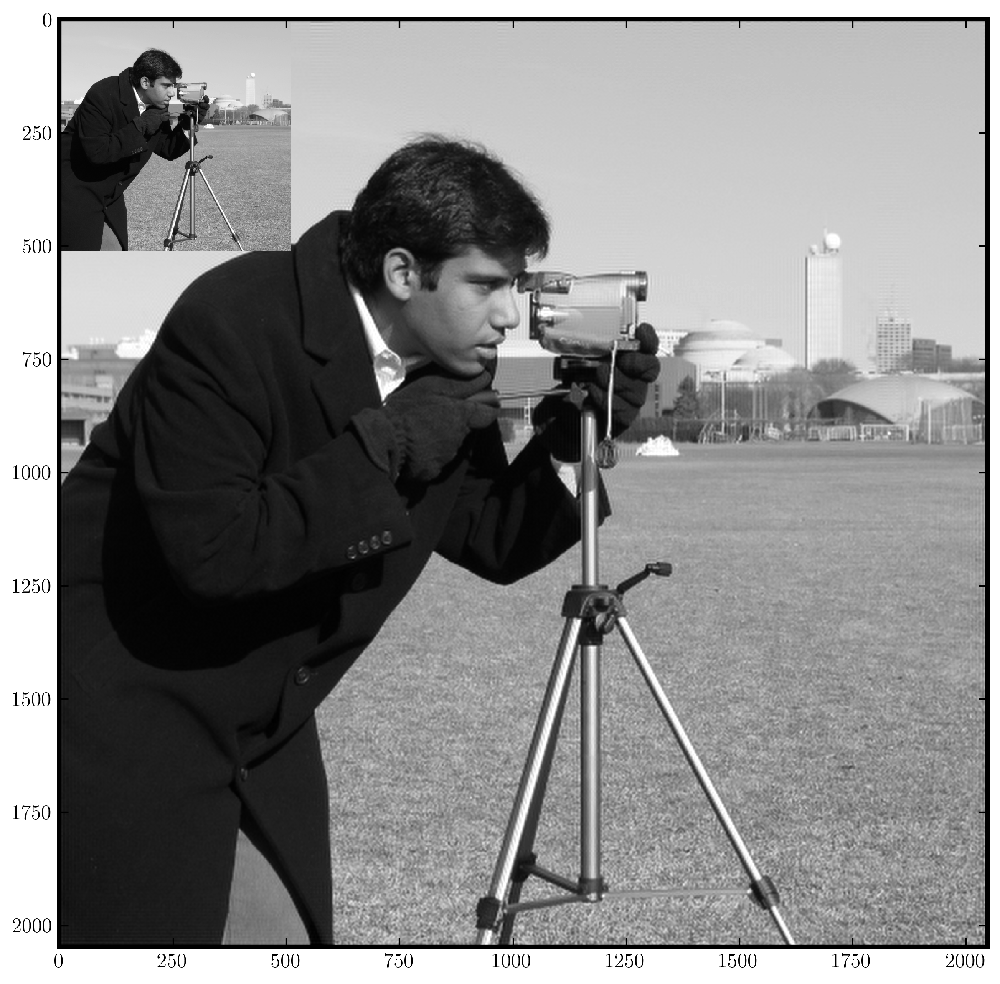

In [23]:
fig = plt.figure(figsize=(8, 8), dpi=300)
plt.imshow(image_plot, cmap='gray')
fig.tight_layout()
plt.show()

**RGB image**

In [24]:
image = data.astronaut()

In [25]:
upscale_factor = 2

In [26]:
resample_image_rgb = qft_resampling_2d(image, upscale_factor)

In [27]:
%%time
upscaled_image = resample_image_rgb()

CPU times: user 29.5 s, sys: 405 ms, total: 29.9 s
Wall time: 14.6 s


In [32]:
print(resample_image_rgb.qft_int_circuit().summary())

Circuit depth = 42
Total number of gates = 244
Number of qubits = 24
Most common gates:
cu1: 182
h: 40
swap: 18
cx: 4


In [28]:
image_plot = upscaled_image.copy()
image_plot[:image.shape[0], :image.shape[1],:] = image

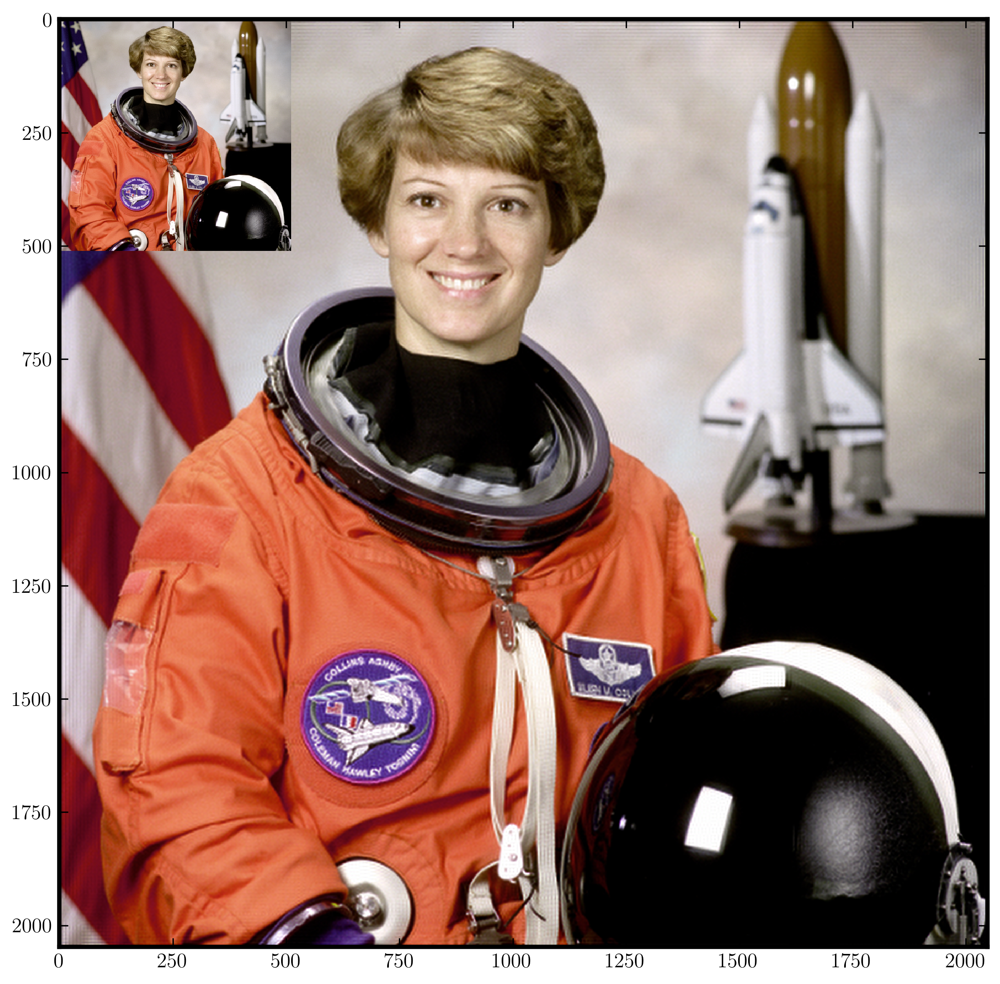

In [29]:
fig = plt.figure(figsize=(8, 8), dpi=300)
plt.imshow(image_plot, cmap='gray')
fig.tight_layout()
plt.show()